In [1]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline 

import tensorflow as tf
import random
from cv2 import resize
from glob import glob

import warnings
warnings.filterwarnings("ignore")

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

# Data Processing

In [2]:
img_height = 244
img_width = 244
train_ds = tf.keras.utils.image_dataset_from_directory(
  '/kaggle/input/solar-panel-images/Faulty_solar_panel',
  validation_split=0.2,
  subset='training',
  image_size=(img_height, img_width),
  batch_size=32,
  seed=42,
  shuffle=True)

val_ds = tf.keras.utils.image_dataset_from_directory(
  '/kaggle/input/solar-panel-images/Faulty_solar_panel',
  validation_split=0.2,
  subset='validation',
  image_size=(img_height, img_width),
  batch_size=32,
  seed=42,
  shuffle=True)

Found 885 files belonging to 6 classes.
Using 708 files for training.
Found 885 files belonging to 6 classes.
Using 177 files for validation.


In [3]:
class_names = train_ds.class_names
print(class_names)
train_ds

['Bird-drop', 'Clean', 'Dusty', 'Electrical-damage', 'Physical-Damage', 'Snow-Covered']


<_BatchDataset element_spec=(TensorSpec(shape=(None, 244, 244, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [2]:
# plt.figure(figsize=(15, 15))
# for images, labels in train_ds.take(1):
#     for i in range(25):
#         ax = plt.subplot(5, 5, i + 1)
#         plt.imshow(images[i].numpy().astype("uint8"))
#         plt.title(class_names[labels[i]])
#         plt.axis("off")

SyntaxError: invalid syntax (932738660.py, line 1)

# CNN with VGG16

In [4]:
base_model_1 = tf.keras.applications.VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=(img_height, img_width, 3)
)
base_model_1.trainable = False 

58889256/58889256 [==============================] - 2s 0us/step


In [5]:
inputs_1 = tf.keras.Input(shape=(img_height, img_width, 3))
x = tf.keras.applications.vgg16.preprocess_input(inputs_1)
x = base_model_1(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.3)(x)
outputs_1 = tf.keras.layers.Dense(90)(x)
model_1 = tf.keras.Model(inputs_1, outputs_1)

model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 244, 244, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 244, 244, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 244, 244, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 512)               0     

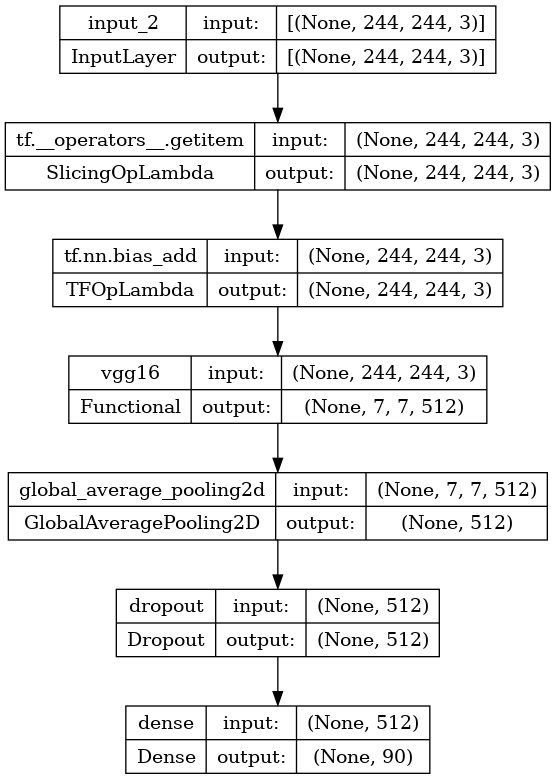

In [6]:
from keras.utils.vis_utils import plot_model
plot_model(model_1, to_file='vgg_16.png', show_shapes=True, show_layer_names=True)

In [7]:
#Training with VGG16
base_model_1.trainable = True
for layer in base_model_1.layers[:14]:
    layer.trainable = False
model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 244, 244, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 244, 244, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 244, 244, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 512)               0     

In [8]:
model_1.compile(optimizer=tf.keras.optimizers.Adam(0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [9]:
epoch = 15
history_1 = model_1.fit(train_ds, validation_data=val_ds, epochs=epoch,
    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss",
            min_delta=1e-2,
            patience=3,
            verbose=1,
        )
    ]
)

Epoch 1/15
23/23 [==============================] - 30s 592ms/step - loss: 3.2482 - accuracy: 0.3362 - val_loss: 1.5013 - val_accuracy: 0.5424
Epoch 2/15
23/23 [==============================] - 13s 421ms/step - loss: 1.1102 - accuracy: 0.6483 - val_loss: 0.9442 - val_accuracy: 0.6836
Epoch 3/15
23/23 [==============================] - 12s 394ms/step - loss: 0.6747 - accuracy: 0.7924 - val_loss: 0.8484 - val_accuracy: 0.7571
Epoch 4/15
23/23 [==============================] - 13s 422ms/step - loss: 0.3577 - accuracy: 0.8771 - val_loss: 0.8358 - val_accuracy: 0.8192
Epoch 5/15
23/23 [==============================] - 12s 388ms/step - loss: 0.2692 - accuracy: 0.9040 - val_loss: 0.7746 - val_accuracy: 0.7797
Epoch 6/15
23/23 [==============================] - 12s 394ms/step - loss: 0.1672 - accuracy: 0.9477 - val_loss: 0.7157 - val_accuracy: 0.8023
Epoch 7/15
23/23 [==============================] - 12s 387ms/step - loss: 0.1273 - accuracy: 0.9562 - val_loss: 0.8687 - val_accuracy: 0.8362

# CNN with VGG19

In [10]:
base_model_2 = tf.keras.applications.VGG19(
    include_top=False,
    weights='imagenet',
    input_shape=(img_height, img_width, 3)
)
base_model_2.trainable = False 

80134624/80134624 [==============================] - 3s 0us/step


In [11]:
inputs_2 = tf.keras.Input(shape=(img_height, img_width, 3))
x = tf.keras.applications.vgg19.preprocess_input(inputs_2)
x = base_model_2(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.3)(x)
outputs_2 = tf.keras.layers.Dense(90)(x)
model_2 = tf.keras.Model(inputs_2, outputs_2)

model_2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 244, 244, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 244, 244, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 244, 244, 3)      0         
 a)                                                              
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

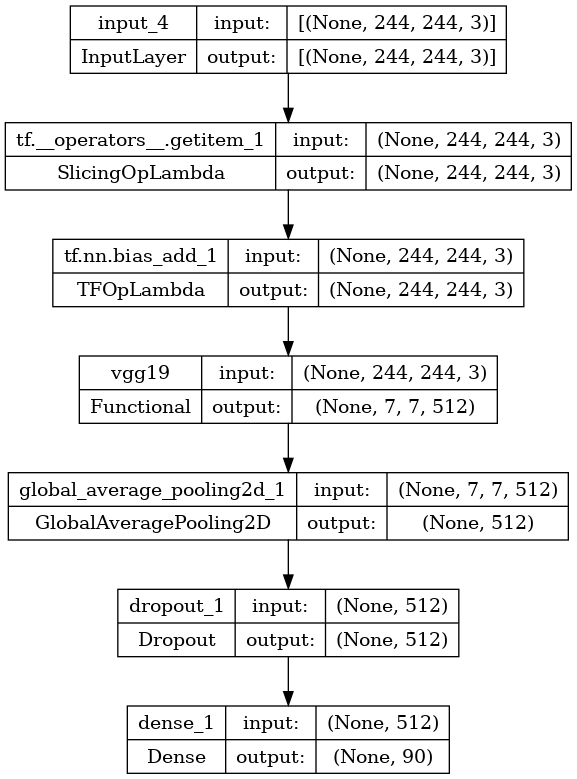

In [12]:
from keras.utils.vis_utils import plot_model
plot_model(model_2, to_file='vgg_19.png', show_shapes=True, show_layer_names=True)

In [13]:
#Training
base_model_2.trainable = True
for layer in base_model_2.layers[:17]:
    layer.trainable = False
model_2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 244, 244, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 244, 244, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 244, 244, 3)      0         
 a)                                                              
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [14]:
model_2.compile(optimizer=tf.keras.optimizers.Adam(0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [15]:
epoch = 15
history_2 = model_2.fit(train_ds, validation_data=val_ds, epochs=epoch,
    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss",
            min_delta=1e-2,
            patience=3,
            verbose=1,
        )
    ]
)

Epoch 1/15
23/23 [==============================] - 16s 428ms/step - loss: 3.1079 - accuracy: 0.3234 - val_loss: 1.0417 - val_accuracy: 0.6271
Epoch 2/15
23/23 [==============================] - 13s 407ms/step - loss: 0.9929 - accuracy: 0.7034 - val_loss: 0.8669 - val_accuracy: 0.7175
Epoch 3/15
23/23 [==============================] - 12s 401ms/step - loss: 0.5083 - accuracy: 0.8263 - val_loss: 0.4723 - val_accuracy: 0.8814
Epoch 4/15
23/23 [==============================] - 13s 404ms/step - loss: 0.2919 - accuracy: 0.9223 - val_loss: 0.4687 - val_accuracy: 0.8418
Epoch 5/15
23/23 [==============================] - 12s 396ms/step - loss: 0.1632 - accuracy: 0.9548 - val_loss: 0.4786 - val_accuracy: 0.8475
Epoch 6/15
23/23 [==============================] - 13s 426ms/step - loss: 0.1128 - accuracy: 0.9633 - val_loss: 0.6025 - val_accuracy: 0.8644
Epoch 6: early stopping


# Plot for VGG16

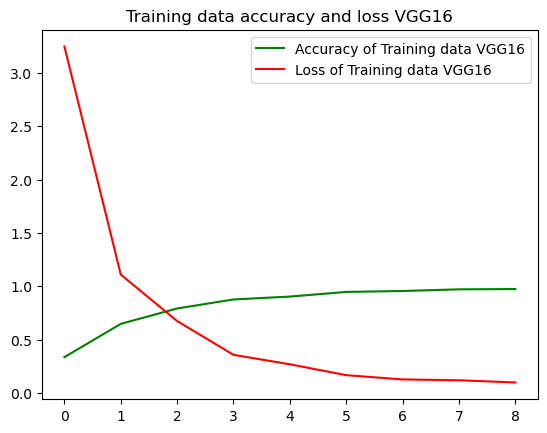

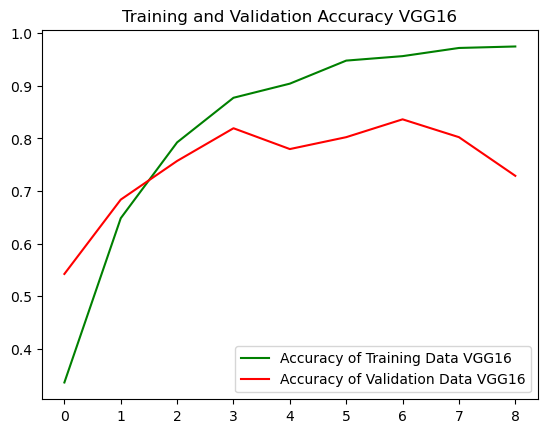

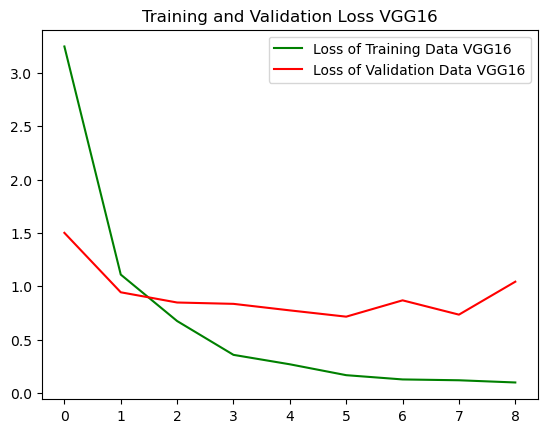

<Figure size 640x480 with 0 Axes>

In [17]:
get_ac_1 = history_1.history['accuracy']
get_los_1 = history_1.history['loss']
val_acc_1 = history_1.history['val_accuracy']
val_loss_1 = history_1.history['val_loss']

epochs = range(len(get_ac_1))
plt.plot(epochs, get_ac_1, 'g', label='Accuracy of Training data VGG16')
plt.plot(epochs, get_los_1, 'r', label='Loss of Training data VGG16')
plt.title('Training data accuracy and loss VGG16')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, get_ac_1, 'g', label='Accuracy of Training Data VGG16')
plt.plot(epochs, val_acc_1, 'r', label='Accuracy of Validation Data VGG16')
plt.title('Training and Validation Accuracy VGG16')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, get_los_1, 'g', label='Loss of Training Data VGG16')
plt.plot(epochs, val_loss_1, 'r', label='Loss of Validation Data VGG16')
plt.title('Training and Validation Loss VGG16')
plt.legend(loc=0)
plt.figure()
plt.show()

# Plot for VGG19

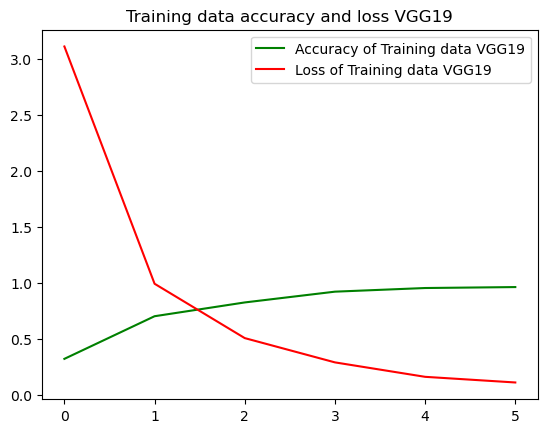

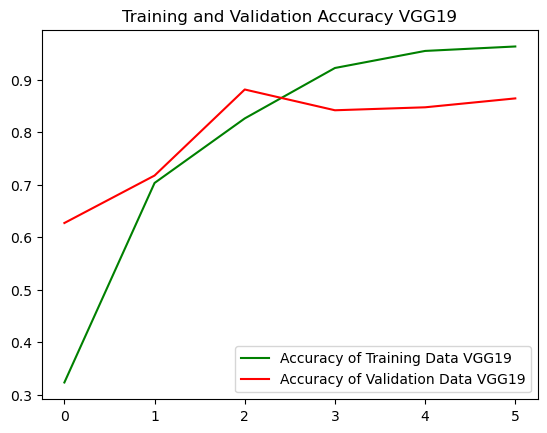

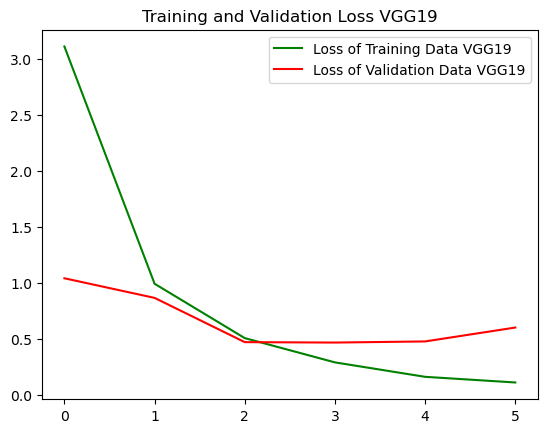

<Figure size 640x480 with 0 Axes>

In [18]:
get_ac_2 = history_2.history['accuracy']
get_los_2 = history_2.history['loss']
val_acc_2 = history_2.history['val_accuracy']
val_loss_2 = history_2.history['val_loss']

epochs = range(len(get_ac_2))
plt.plot(epochs, get_ac_2, 'g', label='Accuracy of Training data VGG19')
plt.plot(epochs, get_los_2, 'r', label='Loss of Training data VGG19')
plt.title('Training data accuracy and loss VGG19')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, get_ac_2, 'g', label='Accuracy of Training Data VGG19')
plt.plot(epochs, val_acc_2, 'r', label='Accuracy of Validation Data VGG19')
plt.title('Training and Validation Accuracy VGG19')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, get_los_2, 'g', label='Loss of Training Data VGG19')
plt.plot(epochs, val_loss_2, 'r', label='Loss of Validation Data VGG19')
plt.title('Training and Validation Loss VGG19')
plt.legend(loc=0)
plt.figure()
plt.show()

# Prediction with VGG16

1/1 [==============================] - 0s 33ms/step


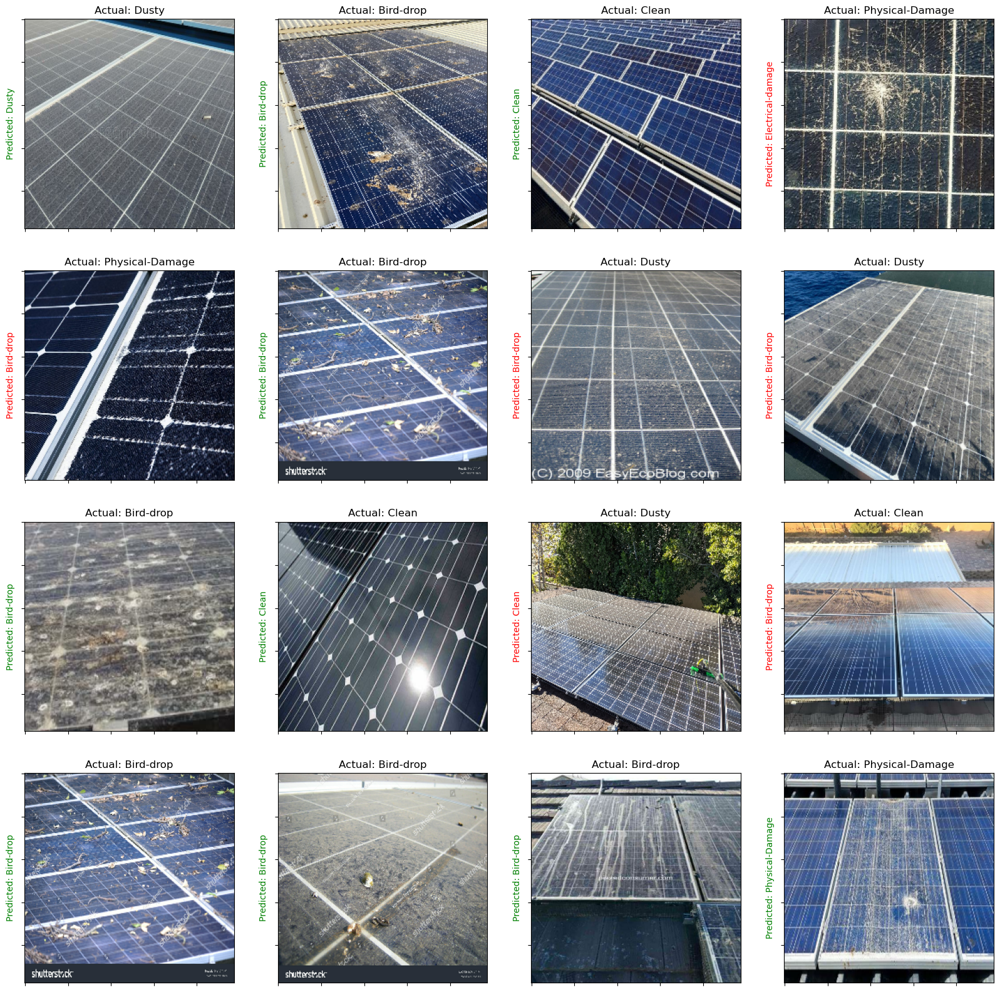

In [22]:
loss, accuracy = model_1.evaluate(val_ds)

plt.figure(figsize=(20, 20))
for images, labels in val_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model_1.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})
            
        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])        
        plt.gca().axes.xaxis.set_ticklabels([])

# Prediction with VGG19

1/1 [==============================] - 0s 21ms/step


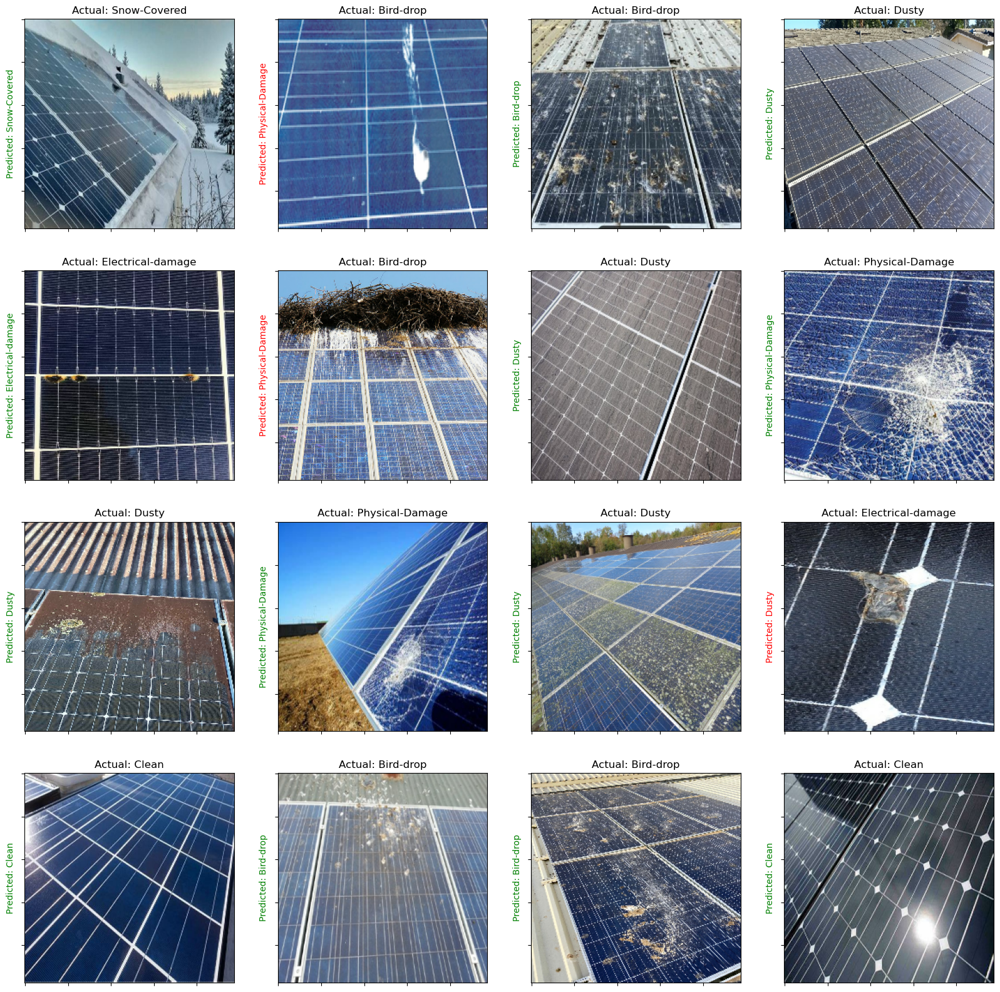

In [23]:
loss, accuracy = model_2.evaluate(val_ds)

plt.figure(figsize=(20, 20))
for images, labels in val_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model_2.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})
            
        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])        
        plt.gca().axes.xaxis.set_ticklabels([])

In [26]:
#Model Save
model_1.save('VGG16_model.h5')
model_2.save('VGG19_model.h5')